In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
import pytesseract as pt
import plotly.express as px
import matplotlib.pyplot as plt
import xml.etree.ElementTree as xet

from glob import glob
from skimage import io
from shutil import copy
from keras.models import Model
from keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split
from keras.applications import InceptionResNetV2
from keras.layers import Dense, Dropout, Flatten, Input
from keras.utils import load_img, img_to_array


In [9]:
path = glob('D:\FastApi\images\*.xml')
labels_dict = dict(filepath=[],xmin=[],xmax=[],ymin=[],ymax=[])
for filename in path:

    info = xet.parse(filename)
    root = info.getroot()
    member_object = root.find('object')
    labels_info = member_object.find('bndbox')
    xmin = int(labels_info.find('xmin').text)
    xmax = int(labels_info.find('xmax').text)
    ymin = int(labels_info.find('ymin').text)
    ymax = int(labels_info.find('ymax').text)

    labels_dict['filepath'].append(filename)
    labels_dict['xmin'].append(xmin)
    labels_dict['xmax'].append(xmax)
    labels_dict['ymin'].append(ymin)
    labels_dict['ymax'].append(ymax)

In [10]:
path

['D:\\FastApi\\images\\N1.xml',
 'D:\\FastApi\\images\\N100.xml',
 'D:\\FastApi\\images\\N101.xml',
 'D:\\FastApi\\images\\N102.xml',
 'D:\\FastApi\\images\\N103.xml',
 'D:\\FastApi\\images\\N104.xml',
 'D:\\FastApi\\images\\N105.xml',
 'D:\\FastApi\\images\\N106.xml',
 'D:\\FastApi\\images\\N107.xml',
 'D:\\FastApi\\images\\N108.xml',
 'D:\\FastApi\\images\\N109.xml',
 'D:\\FastApi\\images\\N11.xml',
 'D:\\FastApi\\images\\N110.xml',
 'D:\\FastApi\\images\\N111.xml',
 'D:\\FastApi\\images\\N112.xml',
 'D:\\FastApi\\images\\N113.xml',
 'D:\\FastApi\\images\\N114.xml',
 'D:\\FastApi\\images\\N116.xml',
 'D:\\FastApi\\images\\N117.xml',
 'D:\\FastApi\\images\\N118.xml',
 'D:\\FastApi\\images\\N119.xml',
 'D:\\FastApi\\images\\N12.xml',
 'D:\\FastApi\\images\\N120.xml',
 'D:\\FastApi\\images\\N121.xml',
 'D:\\FastApi\\images\\N122.xml',
 'D:\\FastApi\\images\\N123.xml',
 'D:\\FastApi\\images\\N124.xml',
 'D:\\FastApi\\images\\N126.xml',
 'D:\\FastApi\\images\\N127.xml',
 'D:\\FastApi\\ima

In [11]:
df = pd.DataFrame(labels_dict)
df.to_csv('labels.csv',index=False)
df.head()

,filepath,xmin,xmax,ymin,ymax
0,D:\FastApi\images\N1.xml,1093,1396,645,727
1,D:\FastApi\images\N100.xml,134,301,312,350
2,D:\FastApi\images\N101.xml,31,139,128,161
3,D:\FastApi\images\N102.xml,164,316,216,243
4,D:\FastApi\images\N103.xml,813,1067,665,724


In [12]:
df['filepath'][0]

'D:\\FastApi\\images\\N1.xml'

With the above code, we successfully extract the diagonal position of each image and convert the data from an unstructured to a structured format.You can have A look data above. Now also extract the respective image filename of the XML.

In [13]:
filename = df['filepath'][0]
def getFilename(filename):
    filename_image = xet.parse(filename).getroot().find('filename').text
    filepath_image = os.path.join('D:\FastApi\images',filename_image)
    return filepath_image
getFilename(filename)

'D:\\FastApi\\images\\N1.jpeg'

In [14]:
image_path = list(df['filepath'].apply(getFilename))
image_path[:10]#random check

['D:\\FastApi\\images\\N1.jpeg',
 'D:\\FastApi\\images\\N100.jpeg',
 'D:\\FastApi\\images\\N101.jpeg',
 'D:\\FastApi\\images\\N102.jpeg',
 'D:\\FastApi\\images\\N103.jpeg',
 'D:\\FastApi\\images\\N104.jpeg',
 'D:\\FastApi\\images\\N105.jpeg',
 'D:\\FastApi\\images\\N106.jpeg',
 'D:\\FastApi\\images\\N107.jpeg',
 'D:\\FastApi\\images\\N108.jpeg']

<p id="part10"></p>

# <span style="font-family: Arials; font-size: 16px; font-style: normal; font-weight: bold; letter-spacing: 3px; text-align: center; color: #000000; line-height:1.0">2.5 VERIFY THE DATA</span>

As till now we did the manual process it is important to verify the information is we got is valid or not. For that just verify the bounding box is appearing properly for a given image. Here I consider the image N2.jpeg and the corresponding diagonal position can found in df. Result you can see on *Figure 8*

In [15]:
image_path[0]

'D:\\FastApi\\images\\N1.jpeg'

In [16]:
file_path = image_path[0] #path of our image N1.jpeg
img = cv2.imread(file_path) #read the image
# xmin-1804/ymin-1734/xmax-2493/ymax-1882 
img = io.imread(file_path) #Read the image
fig = px.imshow(img)
fig.update_layout(width=600, height=500, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='N1.jpeg with bounding box')
fig.add_shape(type='rect',x0=1093, x1=1396, y0=645, y1=727, xref='x', yref='y',line_color='cyan')

In [17]:
img

array([[[173, 214, 210],
        [178, 219, 215],
        [185, 226, 222],
        ...,
        [149, 120, 116],
        [149, 120, 116],
        [149, 120, 116]],

       [[172, 213, 209],
        [179, 220, 216],
        [190, 231, 227],
        ...,
        [161, 132, 128],
        [160, 131, 127],
        [159, 130, 126]],

       [[176, 215, 212],
        [186, 225, 222],
        [202, 241, 238],
        ...,
        [160, 129, 127],
        [158, 127, 125],
        [158, 127, 125]],

       ...,

       [[215, 203, 177],
        [211, 199, 173],
        [205, 193, 167],
        ...,
        [158, 161, 150],
        [163, 166, 155],
        [189, 192, 181]],

       [[162, 148, 121],
        [156, 142, 115],
        [148, 134, 107],
        ...,
        [116, 119, 108],
        [118, 121, 110],
        [140, 143, 132]],

       [[107,  93,  64],
        [100,  86,  57],
        [ 91,  77,  50],
        ...,
        [136, 139, 128],
        [138, 141, 130],
        [137, 140, 129]]

In [18]:
#Targeting all our values in array selecting all columns
labels = df.iloc[:,1:].values
data = []
output = []
for ind in range(len(image_path)):
    image = image_path[ind]
    img_arr = cv2.imread(image)
    h,w,d = img_arr.shape
    # Prepprocesing
    load_image = load_img(image,target_size=(224,224))
    load_image_arr = img_to_array(load_image)
    norm_load_image_arr = load_image_arr/255.0 # Normalization
    # Normalization to labels
    xmin,xmax,ymin,ymax = labels[ind]
    nxmin,nxmax = xmin/w,xmax/w
    nymin,nymax = ymin/h,ymax/h
    label_norm = (nxmin,nxmax,nymin,nymax) # Normalized output
    # Append
    data.append(norm_load_image_arr)
    output.append(label_norm)

In [19]:
# Convert data to array
X = np.array(data,dtype=np.float32)
y = np.array(output,dtype=np.float32)

Now split the data into training and testing set using __sklearn__.

In [20]:
# Split the data into training and testing set using sklearn.
x_train,x_test,y_train,y_test = train_test_split(X,y,train_size=0.8,random_state=0)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((180, 224, 224, 3), (45, 224, 224, 3), (180, 4), (45, 4))

In [21]:
inception_resnet = InceptionResNetV2(weights="imagenet",include_top=False, input_tensor=Input(shape=(224,224,3)))
# ---------------------
headmodel = inception_resnet.output
headmodel = Flatten()(headmodel)
headmodel = Dense(500,activation="relu")(headmodel)
headmodel = Dense(250,activation="relu")(headmodel)
headmodel = Dense(4,activation='sigmoid')(headmodel)


# ---------- model
model = Model(inputs=inception_resnet.input,outputs=headmodel)

 33505280/219055592 [===>..........................] - ETA: 8:20

KeyboardInterrupt: 

Now compile the model and  have a look at our summary. Don't de surprise summary will be a bit massiv. The summary is textual and includes information about: The layers and their order in the model. The output shape of each layer. The number of parameters (weights) in each layer.

In [ ]:
# Complie model
model.compile(loss='mse',optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4))
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

 batch_normalization_5 (BatchNo  (None, 25, 25, 96)  288         ['conv2d_5[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_7 (BatchNo  (None, 25, 25, 64)  192         ['conv2d_7[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_10 (BatchN  (None, 25, 25, 96)  288         ['conv2d_10[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_11 (BatchN  (None, 25, 25, 64)  192         ['conv2d_11[0][0]']              
 ormalizat

 activation_21 (Activation)     (None, 25, 25, 32)   0           ['batch_normalization_21[0][0]'] 
                                                                                                  
 conv2d_19 (Conv2D)             (None, 25, 25, 32)   10240       ['block35_1_ac[0][0]']           
                                                                                                  
 conv2d_22 (Conv2D)             (None, 25, 25, 48)   13824       ['activation_21[0][0]']          
                                                                                                  
 batch_normalization_19 (BatchN  (None, 25, 25, 32)  96          ['conv2d_19[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_22 (BatchN  (None, 25, 25, 48)  144         ['conv2d_22[0][0]']              
 ormalizat

                                                                                                  
 activation_24 (Activation)     (None, 25, 25, 32)   0           ['batch_normalization_24[0][0]'] 
                                                                                                  
 activation_26 (Activation)     (None, 25, 25, 32)   0           ['batch_normalization_26[0][0]'] 
                                                                                                  
 activation_29 (Activation)     (None, 25, 25, 64)   0           ['batch_normalization_29[0][0]'] 
                                                                                                  
 block35_3_mixed (Concatenate)  (None, 25, 25, 128)  0           ['activation_24[0][0]',          
                                                                  'activation_26[0][0]',          
                                                                  'activation_29[0][0]']          
          

 ormalization)                                                                                    
                                                                                                  
 batch_normalization_40 (BatchN  (None, 25, 25, 48)  144         ['conv2d_40[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_37 (Activation)     (None, 25, 25, 32)   0           ['batch_normalization_37[0][0]'] 
                                                                                                  
 activation_40 (Activation)     (None, 25, 25, 48)   0           ['batch_normalization_40[0][0]'] 
                                                                                                  
 conv2d_36 (Conv2D)             (None, 25, 25, 32)   10240       ['block35_4_ac[0][0]']           
          

 block35_6_mixed (Concatenate)  (None, 25, 25, 128)  0           ['activation_42[0][0]',          
                                                                  'activation_44[0][0]',          
                                                                  'activation_47[0][0]']          
                                                                                                  
 block35_6_conv (Conv2D)        (None, 25, 25, 320)  41280       ['block35_6_mixed[0][0]']        
                                                                                                  
 block35_6 (Lambda)             (None, 25, 25, 320)  0           ['block35_5_ac[0][0]',           
                                                                  'block35_6_conv[0][0]']         
                                                                                                  
 block35_6_ac (Activation)      (None, 25, 25, 320)  0           ['block35_6[0][0]']              
          

 activation_58 (Activation)     (None, 25, 25, 48)   0           ['batch_normalization_58[0][0]'] 
                                                                                                  
 conv2d_54 (Conv2D)             (None, 25, 25, 32)   10240       ['block35_7_ac[0][0]']           
                                                                                                  
 conv2d_56 (Conv2D)             (None, 25, 25, 32)   9216        ['activation_55[0][0]']          
                                                                                                  
 conv2d_59 (Conv2D)             (None, 25, 25, 64)   27648       ['activation_58[0][0]']          
                                                                                                  
 batch_normalization_54 (BatchN  (None, 25, 25, 32)  96          ['conv2d_54[0][0]']              
 ormalization)                                                                                    
          

                                                                  'block35_9_conv[0][0]']         
                                                                                                  
 block35_9_ac (Activation)      (None, 25, 25, 320)  0           ['block35_9[0][0]']              
                                                                                                  
 conv2d_69 (Conv2D)             (None, 25, 25, 32)   10240       ['block35_9_ac[0][0]']           
                                                                                                  
 batch_normalization_69 (BatchN  (None, 25, 25, 32)  96          ['conv2d_69[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_69 (Activation)     (None, 25, 25, 32)   0           ['batch_normalization_69[0][0]'] 
          

 activation_75 (Activation)     (None, 12, 12, 384)  0           ['batch_normalization_75[0][0]'] 
                                                                                                  
 max_pooling2d_2 (MaxPooling2D)  (None, 12, 12, 320)  0          ['block35_10_ac[0][0]']          
                                                                                                  
 mixed_6a (Concatenate)         (None, 12, 12, 1088  0           ['activation_72[0][0]',          
                                )                                 'activation_75[0][0]',          
                                                                  'max_pooling2d_2[0][0]']        
                                                                                                  
 conv2d_77 (Conv2D)             (None, 12, 12, 128)  139264      ['mixed_6a[0][0]']               
                                                                                                  
 batch_nor

                                )                                 'block17_2_conv[0][0]']         
                                                                                                  
 block17_2_ac (Activation)      (None, 12, 12, 1088  0           ['block17_2[0][0]']              
                                )                                                                 
                                                                                                  
 conv2d_85 (Conv2D)             (None, 12, 12, 128)  139264      ['block17_2_ac[0][0]']           
                                                                                                  
 batch_normalization_85 (BatchN  (None, 12, 12, 128)  384        ['conv2d_85[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activatio

                                )                                                                 
                                                                                                  
 conv2d_93 (Conv2D)             (None, 12, 12, 128)  139264      ['block17_4_ac[0][0]']           
                                                                                                  
 batch_normalization_93 (BatchN  (None, 12, 12, 128)  384        ['conv2d_93[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_93 (Activation)     (None, 12, 12, 128)  0           ['batch_normalization_93[0][0]'] 
                                                                                                  
 conv2d_94 (Conv2D)             (None, 12, 12, 160)  143360      ['activation_93[0][0]']          
          

                                                                                                  
 batch_normalization_101 (Batch  (None, 12, 12, 128)  384        ['conv2d_101[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_101 (Activation)    (None, 12, 12, 128)  0           ['batch_normalization_101[0][0]']
                                                                                                  
 conv2d_102 (Conv2D)            (None, 12, 12, 160)  143360      ['activation_101[0][0]']         
                                                                                                  
 batch_normalization_102 (Batch  (None, 12, 12, 160)  480        ['conv2d_102[0][0]']             
 Normalization)                                                                                   
          

                                                                                                  
 activation_109 (Activation)    (None, 12, 12, 128)  0           ['batch_normalization_109[0][0]']
                                                                                                  
 conv2d_110 (Conv2D)            (None, 12, 12, 160)  143360      ['activation_109[0][0]']         
                                                                                                  
 batch_normalization_110 (Batch  (None, 12, 12, 160)  480        ['conv2d_110[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_110 (Activation)    (None, 12, 12, 160)  0           ['batch_normalization_110[0][0]']
                                                                                                  
 conv2d_10

 conv2d_118 (Conv2D)            (None, 12, 12, 160)  143360      ['activation_117[0][0]']         
                                                                                                  
 batch_normalization_118 (Batch  (None, 12, 12, 160)  480        ['conv2d_118[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_118 (Activation)    (None, 12, 12, 160)  0           ['batch_normalization_118[0][0]']
                                                                                                  
 conv2d_116 (Conv2D)            (None, 12, 12, 192)  208896      ['block17_10_ac[0][0]']          
                                                                                                  
 conv2d_119 (Conv2D)            (None, 12, 12, 192)  215040      ['activation_118[0][0]']         
          

 Normalization)                                                                                   
                                                                                                  
 activation_126 (Activation)    (None, 12, 12, 160)  0           ['batch_normalization_126[0][0]']
                                                                                                  
 conv2d_124 (Conv2D)            (None, 12, 12, 192)  208896      ['block17_12_ac[0][0]']          
                                                                                                  
 conv2d_127 (Conv2D)            (None, 12, 12, 192)  215040      ['activation_126[0][0]']         
                                                                                                  
 batch_normalization_124 (Batch  (None, 12, 12, 192)  576        ['conv2d_124[0][0]']             
 Normalization)                                                                                   
          

                                                                                                  
 conv2d_132 (Conv2D)            (None, 12, 12, 192)  208896      ['block17_14_ac[0][0]']          
                                                                                                  
 conv2d_135 (Conv2D)            (None, 12, 12, 192)  215040      ['activation_134[0][0]']         
                                                                                                  
 batch_normalization_132 (Batch  (None, 12, 12, 192)  576        ['conv2d_132[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_135 (Batch  (None, 12, 12, 192)  576        ['conv2d_135[0][0]']             
 Normalization)                                                                                   
          

 conv2d_143 (Conv2D)            (None, 12, 12, 192)  215040      ['activation_142[0][0]']         
                                                                                                  
 batch_normalization_140 (Batch  (None, 12, 12, 192)  576        ['conv2d_140[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_143 (Batch  (None, 12, 12, 192)  576        ['conv2d_143[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_140 (Activation)    (None, 12, 12, 192)  0           ['batch_normalization_140[0][0]']
                                                                                                  
 activatio

 Normalization)                                                                                   
                                                                                                  
 batch_normalization_151 (Batch  (None, 12, 12, 192)  576        ['conv2d_151[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_148 (Activation)    (None, 12, 12, 192)  0           ['batch_normalization_148[0][0]']
                                                                                                  
 activation_151 (Activation)    (None, 12, 12, 192)  0           ['batch_normalization_151[0][0]']
                                                                                                  
 block17_19_mixed (Concatenate)  (None, 12, 12, 384)  0          ['activation_148[0][0]',         
          

 activation_156 (Activation)    (None, 12, 12, 256)  0           ['batch_normalization_156[0][0]']
                                                                                                  
 activation_158 (Activation)    (None, 12, 12, 256)  0           ['batch_normalization_158[0][0]']
                                                                                                  
 activation_161 (Activation)    (None, 12, 12, 288)  0           ['batch_normalization_161[0][0]']
                                                                                                  
 conv2d_157 (Conv2D)            (None, 5, 5, 384)    884736      ['activation_156[0][0]']         
                                                                                                  
 conv2d_159 (Conv2D)            (None, 5, 5, 288)    663552      ['activation_158[0][0]']         
                                                                                                  
 conv2d_16

                                                                                                  
 activation_169 (Activation)    (None, 5, 5, 224)    0           ['batch_normalization_169[0][0]']
                                                                                                  
 conv2d_167 (Conv2D)            (None, 5, 5, 192)    399360      ['block8_1_ac[0][0]']            
                                                                                                  
 conv2d_170 (Conv2D)            (None, 5, 5, 256)    172032      ['activation_169[0][0]']         
                                                                                                  
 batch_normalization_167 (Batch  (None, 5, 5, 192)   576         ['conv2d_167[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_nor

 batch_normalization_175 (Batch  (None, 5, 5, 192)   576         ['conv2d_175[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_178 (Batch  (None, 5, 5, 256)   768         ['conv2d_178[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_175 (Activation)    (None, 5, 5, 192)    0           ['batch_normalization_175[0][0]']
                                                                                                  
 activation_178 (Activation)    (None, 5, 5, 256)    0           ['batch_normalization_178[0][0]']
                                                                                                  
 block8_4_

                                                                                                  
 activation_186 (Activation)    (None, 5, 5, 256)    0           ['batch_normalization_186[0][0]']
                                                                                                  
 block8_6_mixed (Concatenate)   (None, 5, 5, 448)    0           ['activation_183[0][0]',         
                                                                  'activation_186[0][0]']         
                                                                                                  
 block8_6_conv (Conv2D)         (None, 5, 5, 2080)   933920      ['block8_6_mixed[0][0]']         
                                                                                                  
 block8_6 (Lambda)              (None, 5, 5, 2080)   0           ['block8_5_ac[0][0]',            
                                                                  'block8_6_conv[0][0]']          
          

                                                                                                  
 block8_8 (Lambda)              (None, 5, 5, 2080)   0           ['block8_7_ac[0][0]',            
                                                                  'block8_8_conv[0][0]']          
                                                                                                  
 block8_8_ac (Activation)       (None, 5, 5, 2080)   0           ['block8_8[0][0]']               
                                                                                                  
 conv2d_196 (Conv2D)            (None, 5, 5, 192)    399360      ['block8_8_ac[0][0]']            
                                                                                                  
 batch_normalization_196 (Batch  (None, 5, 5, 192)   576         ['conv2d_196[0][0]']             
 Normalization)                                                                                   
          

 )                                                                                                
                                                                                                  
 conv_7b_ac (Activation)        (None, 5, 5, 1536)   0           ['conv_7b_bn[0][0]']             
                                                                                                  
 flatten (Flatten)              (None, 38400)        0           ['conv_7b_ac[0][0]']             
                                                                                                  
 dense (Dense)                  (None, 500)          19200500    ['flatten[0][0]']                
                                                                                                  
 dense_1 (Dense)                (None, 250)          125250      ['dense[0][0]']                  
                                                                                                  
 dense_2 (

<p id="part16"></p>

# <span style="font-family: Arials; font-size: 16px; font-style: normal; font-weight: bold; letter-spacing: 3px; text-align: center; color: #000000; line-height:1.0">4.2 INCEPTION-RESNET-V2 TRAINING AND SAVE</span>

In [ ]:
#tfb = TensorBoard('object_detection')
history = model.fit(x=x_train,y=y_train,batch_size=10,epochs=90,
                    validation_data=(x_test,y_test),callbacks=[])

Epoch 1/90
18/18 [==============================] - 56s 3s/step - loss: 0.0063 - val_loss: 0.0134
Epoch 2/90
18/18 [==============================] - 57s 3s/step - loss: 0.0051 - val_loss: 0.0114
Epoch 3/90
18/18 [==============================] - 56s 3s/step - loss: 0.0041 - val_loss: 0.0122
Epoch 4/90
18/18 [==============================] - 59s 3s/step - loss: 0.0032 - val_loss: 0.0100
Epoch 5/90
18/18 [==============================] - 57s 3s/step - loss: 0.0038 - val_loss: 0.0073
Epoch 6/90
18/18 [==============================] - 56s 3s/step - loss: 0.0030 - val_loss: 0.0073
Epoch 7/90
18/18 [==============================] - 56s 3s/step - loss: 0.0024 - val_loss: 0.0062
Epoch 8/90
18/18 [==============================] - 56s 3s/step - loss: 0.0020 - val_loss: 0.0062
Epoch 9/90
18/18 [==============================] - 57s 3s/step - loss: 0.0014 - val_loss: 0.0057
Epoch 10/90
18/18 [==============================] - 58s 3s/step - loss: 0.0013 - val_loss: 0.0064
Epoch 11/90
18/18 [

18/18 [==============================] - 64s 4s/step - loss: 1.4490e-04 - val_loss: 0.0038
Epoch 82/90
18/18 [==============================] - 64s 4s/step - loss: 1.4024e-04 - val_loss: 0.0036
Epoch 83/90
18/18 [==============================] - 65s 4s/step - loss: 1.3830e-04 - val_loss: 0.0038
Epoch 84/90
18/18 [==============================] - 65s 4s/step - loss: 1.2622e-04 - val_loss: 0.0037
Epoch 85/90
18/18 [==============================] - 64s 4s/step - loss: 1.2371e-04 - val_loss: 0.0037
Epoch 86/90
18/18 [==============================] - 64s 4s/step - loss: 1.2966e-04 - val_loss: 0.0037
Epoch 87/90
18/18 [==============================] - 64s 4s/step - loss: 1.3885e-04 - val_loss: 0.0037
Epoch 88/90
18/18 [==============================] - 65s 4s/step - loss: 1.4482e-04 - val_loss: 0.0035
Epoch 89/90
18/18 [==============================] - 67s 4s/step - loss: 1.2560e-04 - val_loss: 0.0037
Epoch 90/90
18/18 [==============================] - 65s 4s/step - loss: 1.0645e-04 -

In [ ]:
model.save('npl_detection.h5')

In [70]:
# Load model
model = tf.keras.models.load_model('npl_detection.h5')
print('Model loaded Sucessfully')

Model loaded Sucessfully


Next is loading our TEST picture with right path to it. I loaded some more images for this purpose  only - folder __TEST__.

In [89]:
path = "D:\Automatic-License-Plate-Detection-main\TEST\TEST1.jpeg"
image = load_img(path) # PIL object
image = np.array(image,dtype=np.uint8) # 8 bit array (0,255)
image1 = load_img(path,target_size=(224,224))
image_arr_224 = img_to_array(image1)/255.0  # Convert into array and get the normalized output

# Size of the orginal image
h,w,d = image.shape
print('Height of the image =',h)
print('Width of the image =',w)


Height of the image = 742
Width of the image = 1200


Now we can have a look at our image *Figure 13*


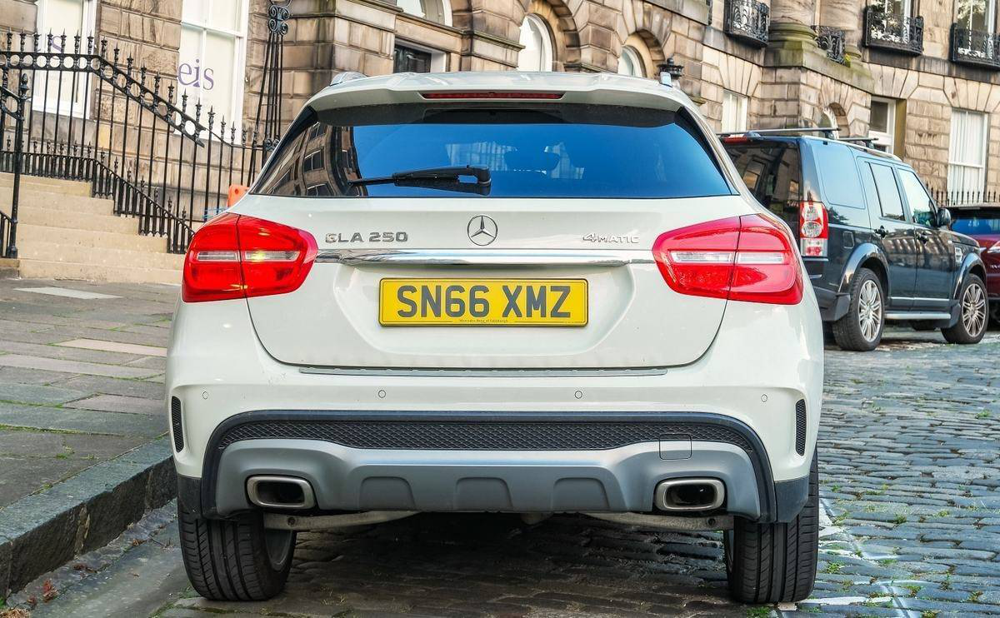

In [90]:
fig = px.imshow(image)
fig.update_layout(width=700, height=500,  margin=dict(l=10, r=10, b=10, t=10), xaxis_title='Figure 13 - TEST Image')

So, let's look into the shape of my image.

In [91]:
image_arr_224.shape

(224, 224, 3)

But in order to pass this image of a model, we need to provide the data in the dynamic fourth dimension. And what one indicates is a number of images. So here we are just passing only one image.

In [92]:
test_arr = image_arr_224.reshape(1,224,224,3)
test_arr.shape

(1, 224, 224, 3)

<p id="part20"></p>

# <span style="font-family: Arials; font-size: 16px; font-style: normal; font-weight: bold; letter-spacing: 3px; text-align: center; color: #000000; line-height:1.0">5.2 DE-NORMALIZE THE OUTPUT</span>

In [93]:
# Make predictions
coords = model.predict(test_arr)
coords

1/1 [==============================] - 0s 119ms/step


array([[0.37694302, 0.6065514 , 0.48755848, 0.58869046]], dtype=float32)

We have got the output from the model and output what we got is the normalized output. So, what we need to do is to convert back into our original form values, which actually we did in during the training process, in the training process, we have the original form values and convert that normalized one. So basically, we will de-normalize the values back.

In [94]:
# Denormalize the values
denorm = np.array([w,w,h,h])
coords = coords * denorm
coords

array([[452.33162642, 727.86169052, 361.76839519, 436.80832112]])

<p id="part21"></p>

# <span style="font-family: Arials; font-size: 16px; font-style: normal; font-weight: bold; letter-spacing: 3px; text-align: center; color: #000000; line-height:1.0">5.3 BOUNDING BOX</span>

Now we will draw bounding box on top of the image. I just want to provide the two diagonal points. Let's make use of these points and let's draw the rectangle box.

In [95]:
coords = coords.astype(np.int32)
coords

array([[452, 727, 361, 436]])

In [96]:
# Draw bounding on top the image
xmin, xmax,ymin,ymax = coords[0]
pt1 =(xmin,ymin)
pt2 =(xmax,ymax)
print(pt1, pt2)

(452, 361) (727, 436)



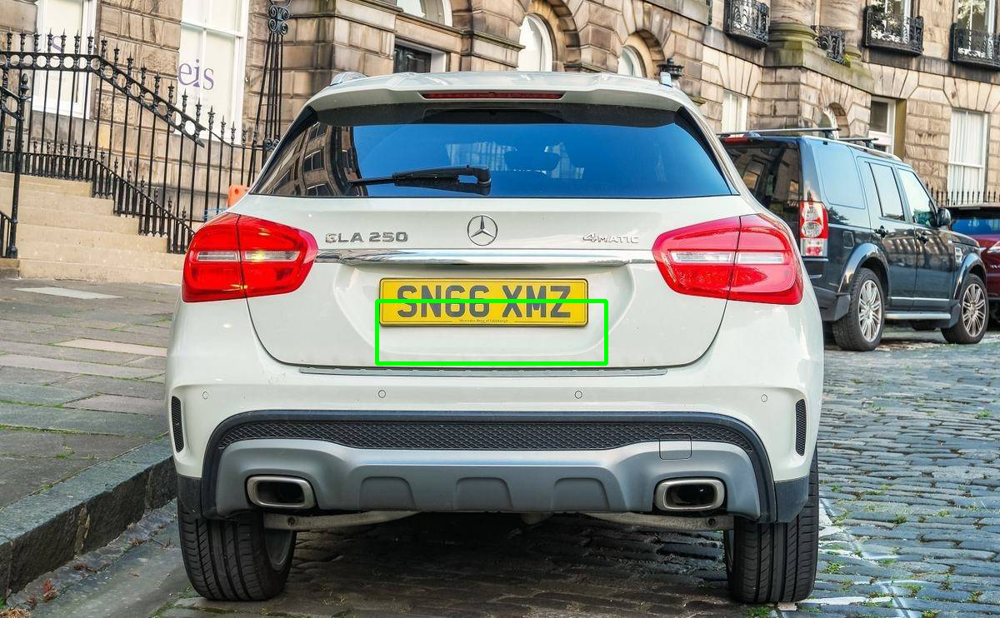

In [97]:
cv2.rectangle(image,pt1,pt2,(0,255,0),3)
fig = px.imshow(image)
fig.update_layout(width=700, height=500, margin=dict(l=10, r=10, b=10, t=10))

<p id="part22"></p>

# <span style="font-family: Arials; font-size: 16px; font-style: normal; font-weight: bold; letter-spacing: 3px; text-align: center; color: #000000; line-height:1.0">5.4 CREATE PIPELINE</span>

Now what we'll do, let's put it all together in one place and create function. And in the end visualize it. Our output will return image and coordinates of bounding box.

1/1 [==============================] - 0s 115ms/step
(842, 623) (1126, 681)



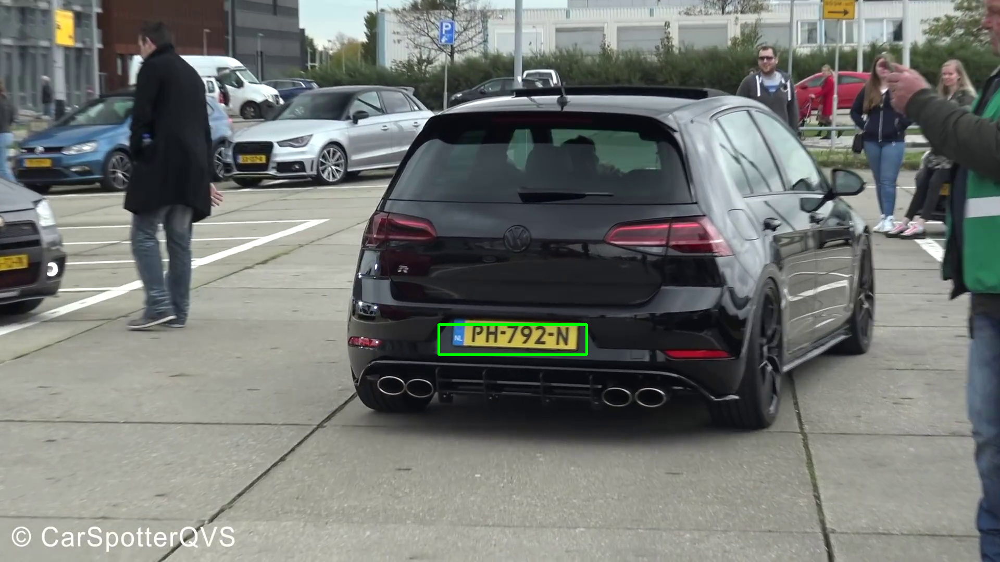

In [99]:
# Create pipeline
path = "D:\Automatic-License-Plate-Detection-main\images\\N6.jpeg"
def object_detection(path):
    
    # Read image
    image = load_img(path) # PIL object
    image = np.array(image,dtype=np.uint8) # 8 bit array (0,255)
    image1 = load_img(path,target_size=(224,224))
    
    # Data preprocessing
    image_arr_224 = img_to_array(image1)/255.0 # Convert to array & normalized
    h,w,d = image.shape
    test_arr = image_arr_224.reshape(1,224,224,3)
    
    # Make predictions
    coords = model.predict(test_arr)
    
    # Denormalize the values
    denorm = np.array([w,w,h,h])
    coords = coords * denorm
    coords = coords.astype(np.int32)
    
    # Draw bounding on top the image
    xmin, xmax,ymin,ymax = coords[0]
    pt1 =(xmin,ymin)
    pt2 =(xmax,ymax)
    print(pt1, pt2)
    cv2.rectangle(image,pt1,pt2,(0,255,0),3)
    return image, coords

image, cods = object_detection(path)

fig = px.imshow(image)
fig.update_layout(width=700, height=500, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 14')


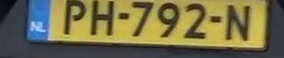

In [100]:
img = np.array(load_img(path))
xmin ,xmax,ymin,ymax = cods[0]
roi = img[ymin:ymax,xmin:xmax]
fig = px.imshow(roi)
fig.update_layout(width=350, height=250, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 15 Cropped image')

With use of tesseract, we will extract the text from the mage.


In [ ]:
# extract text from image
text = pt.image_to_string(roi)
print(text)